In [7]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [8]:
!pip install super-gradients

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 76.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.1/139.1 kB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 52.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 64.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 64.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 30.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 68.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 60.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.0/68.0 kB 7.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to b

In [9]:
import super_gradients
from super_gradients.training import models
from super_gradients.common.object_names import Models

[2023-11-28 14:22:13] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


[2023-11-28 14:22:13] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-11-28 14:22:13] INFO - utils.py - NumExpr defaulting to 2 threads.
[2023-11-28 14:22:23] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-11-28 14:22:23] WARNING - export.py - Failed to import pytorch_quantization
[2023-11-28 14:22:23] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-11-28 14:22:23] WARNING - env_sanity_check.py - Failed to verify installed packages: boto3 required but not found
[2023-11-28 14:22:23] WARNING - env_sanity_check.py - Failed to verify installed packages: deprecated required but not found
[2023-11-28 14:22:23] WARNING - env_sanity_check.py - Failed to verify installed packages: coverage required but not found
[2023-11-28 14:22:23] WARNING - env_sanity_check.py - Failed to verify installed packages: sphinx-rtd-theme required but not found
[2023-11-28 14:22:23] WARNING - env_sanity_check.py - Failed to verify i

In [10]:
yolo_nas = super_gradients.training.models.get('yolo_nas_l', pretrained_weights= "coco")

[2023-11-28 14:22:32] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_l_coco.pth
100%|██████████| 256M/256M [00:03<00:00, 88.2MB/s]
[2023-11-28 14:22:37] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l


In [12]:
!pip install torchinfo
from torchinfo import summary

In [13]:
summary(model =yolo_nas, input_size= (16,3,640,640), # 16 channels and a resolution of 640x640
 col_names =['input_size','output_size','num_params','trainable'],
 col_width =20, row_settings =['var_names'])

Layer (type (var_name))                                           Input Shape          Output Shape         Param #              Trainable
YoloNAS_L (YoloNAS_L)                                             [16, 3, 640, 640]    [16, 8400, 4]        --                   True
├─NStageBackbone (backbone)                                       [16, 3, 640, 640]    [16, 96, 160, 160]   --                   True
│    └─YoloNASStem (stem)                                         [16, 3, 640, 640]    [16, 48, 320, 320]   --                   True
│    │    └─QARepVGGBlock (conv)                                  [16, 3, 640, 640]    [16, 48, 320, 320]   3,024                True
│    └─YoloNASStage (stage1)                                      [16, 48, 320, 320]   [16, 96, 160, 160]   --                   True
│    │    └─QARepVGGBlock (downsample)                            [16, 48, 320, 320]   [16, 96, 160, 160]   88,128               True
│    │    └─YoloNASCSPLayer (blocks)                     

/usr/local/lib/python3.10/dist-packages/torch/amp/autocast_mode.py:250: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
[2023-11-28 14:30:13] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


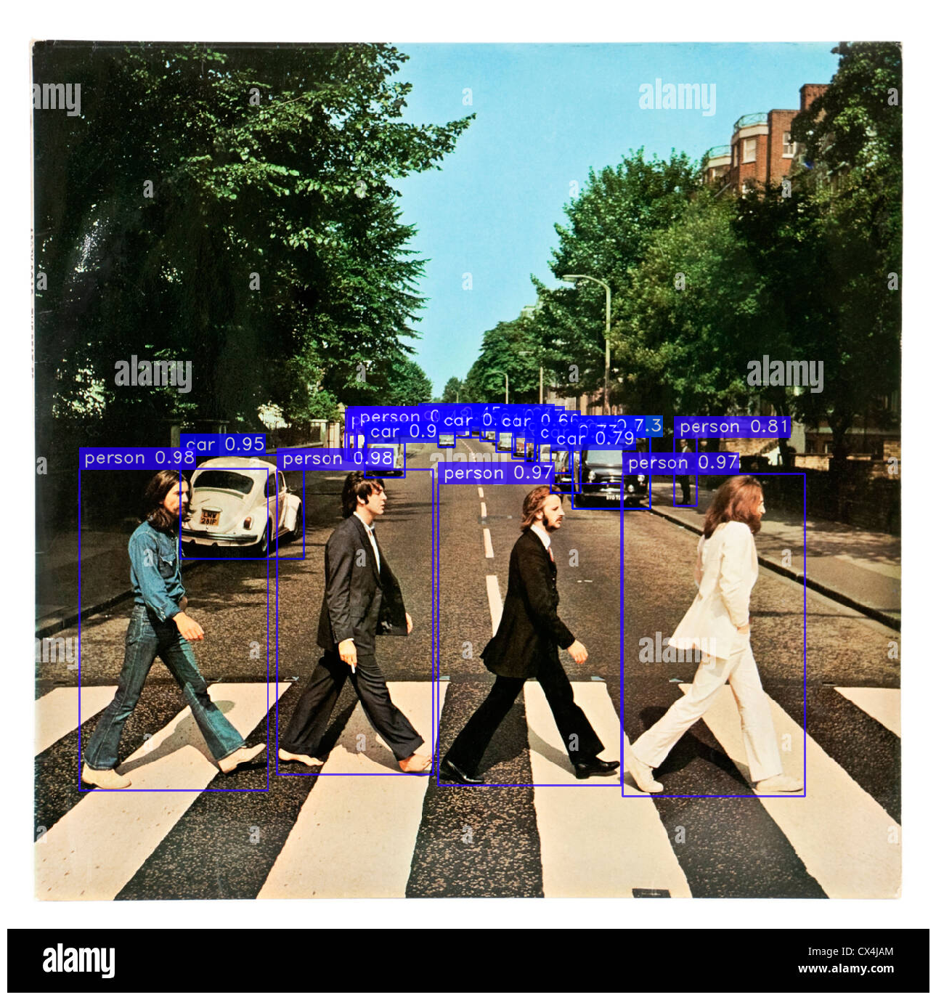

In [15]:
img_file2 ='/content/gdrive/MyDrive/yolov8nas/abbey-road-lp-by-the-beatles-1969-stereo-version-apple-records-pcs-CX4JAM.jpg'
yolo_nas.predict(img_file2, conf =0.25).show()


[2023-11-28 14:34:53] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


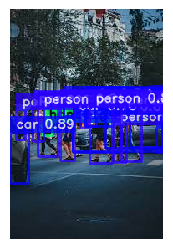

In [17]:
img_file2 ='/content/gdrive/MyDrive/yolov8nas/car.jfif'
yolo_nas.predict(img_file2, conf =0.25).show()


[2023-11-28 15:37:50] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


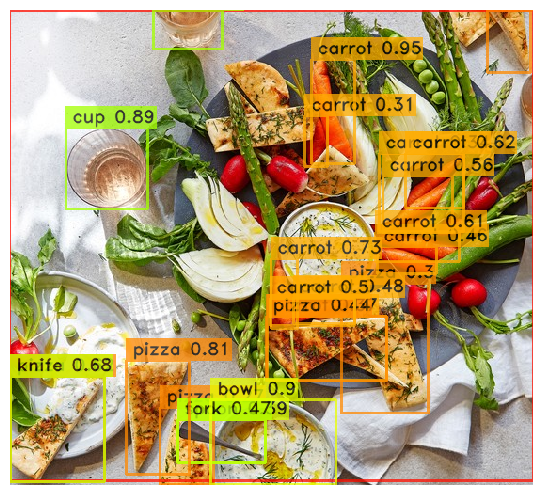

In [18]:
img_file2 ='/content/gdrive/MyDrive/yolov8nas/food.jpg'
yolo_nas.predict(img_file2, conf =0.25).show()


/usr/local/lib/python3.10/dist-packages/super_gradients/common/deprecate.py:168: DeprecationWarning: Parameter `arch_params.channels_in` is deprecated since version `3.3.0` and will be removed in version `4.0.0`.
Please update your code to use the `arch_params.in_channels` instead of `arch_params.channels_in`.
  warnings.warn(message, DeprecationWarning)
Downloading: "https://sghub.deci.ai/models/yolox_s_coco.pth" to /root/.cache/torch/hub/checkpoints/yolox_s_coco.pth
100%|██████████| 34.5M/34.5M [00:01<00:00, 33.7MB/s]
[2023-11-28 15:38:46] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolox_s
/usr/local/lib/python3.10/dist-packages/torch/amp/autocast_mode.py:250: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
[2023-11-28 15:38:46] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
/usr/local/lib/python

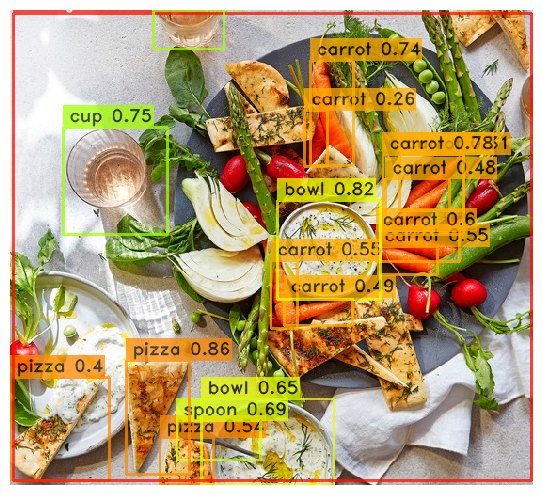

In [19]:
yolox = super_gradients.training.models.get(Models.YOLOX_S, pretrained_weights="coco")
yolox.predict(img_file2, conf=0.25).show()

Downloading: "https://sghub.deci.ai/models/resnet50_imagenet.pth" to /root/.cache/torch/hub/checkpoints/resnet50_imagenet.pth
100%|██████████| 97.8M/97.8M [00:04<00:00, 22.0MB/s]
[2023-11-28 15:39:25] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture resnet50
[2023-11-28 15:39:25] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


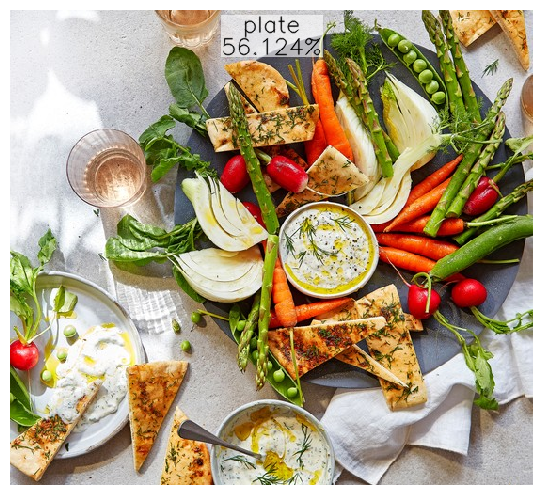

In [20]:
resnet = super_gradients.training.models.get(Models.RESNET50, pretrained_weights="imagenet")
resnet.predict(img_file2).show()


[2023-11-28 15:42:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


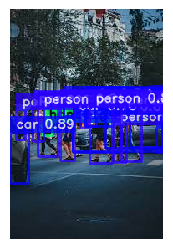

[2023-11-28 15:42:41] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture resnet50
[2023-11-28 15:42:41] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


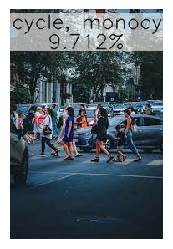

In [23]:
img_file2 ='/content/gdrive/MyDrive/yolov8nas/car.jfif'
yolo_nas.predict(img_file2, conf =0.25).show()


resnet = super_gradients.training.models.get(Models.RESNET50, pretrained_weights="imagenet")
resnet.predict(img_file2).show()

[2023-11-28 15:45:05] INFO - checkpoint_utils.py - License Notification: YOLO-NAS-POSE pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS-POSE.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-11-28 15:45:06] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_pose_l
[2023-11-28 15:45:06] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


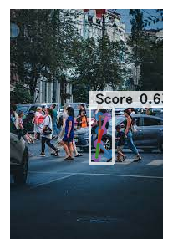

In [25]:
yolo_nas_pose = super_gradients.training.models.get("yolo_nas_pose_l", pretrained_weights="coco_pose")
yolo_nas_pose = yolo_nas_pose.to("cpu")  # Move the model to CPU
model_predictions = yolo_nas_pose.predict(img_file2, conf=0.5).show()


[2023-11-28 16:04:26] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


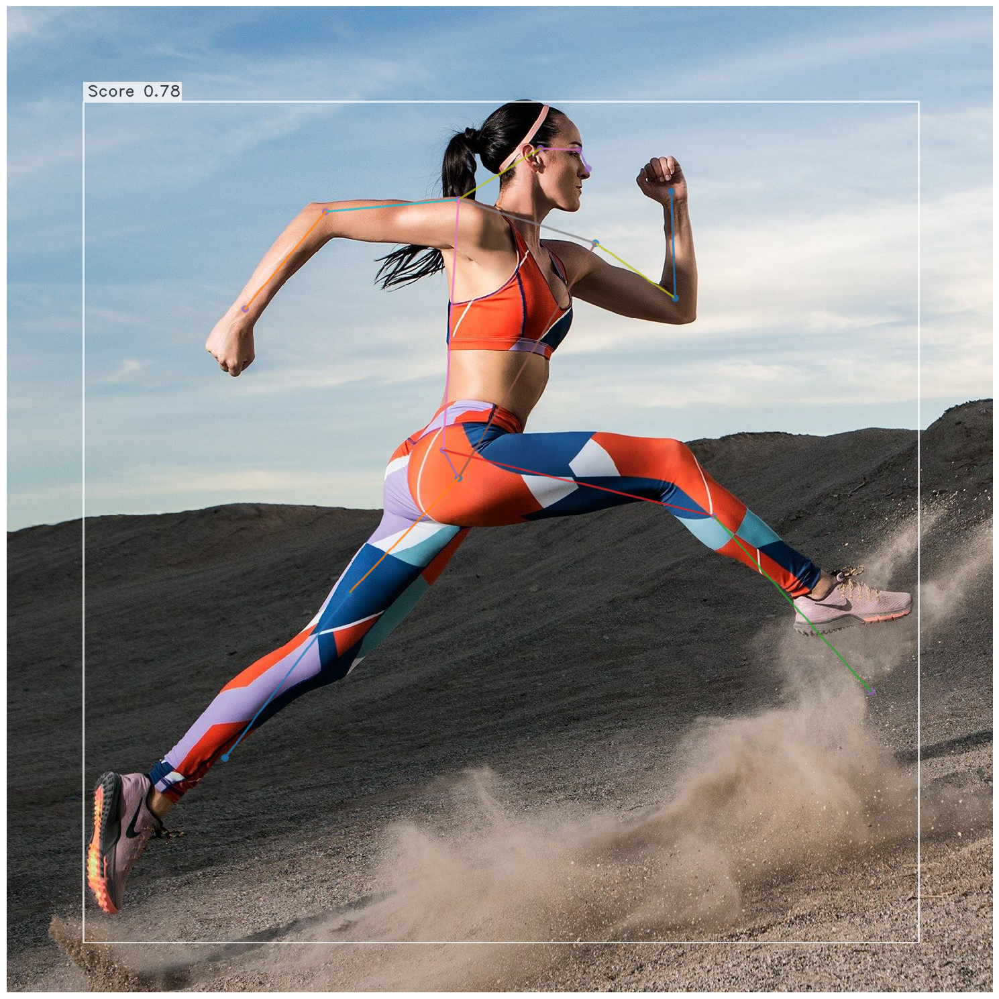

[2023-11-28 16:04:32] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


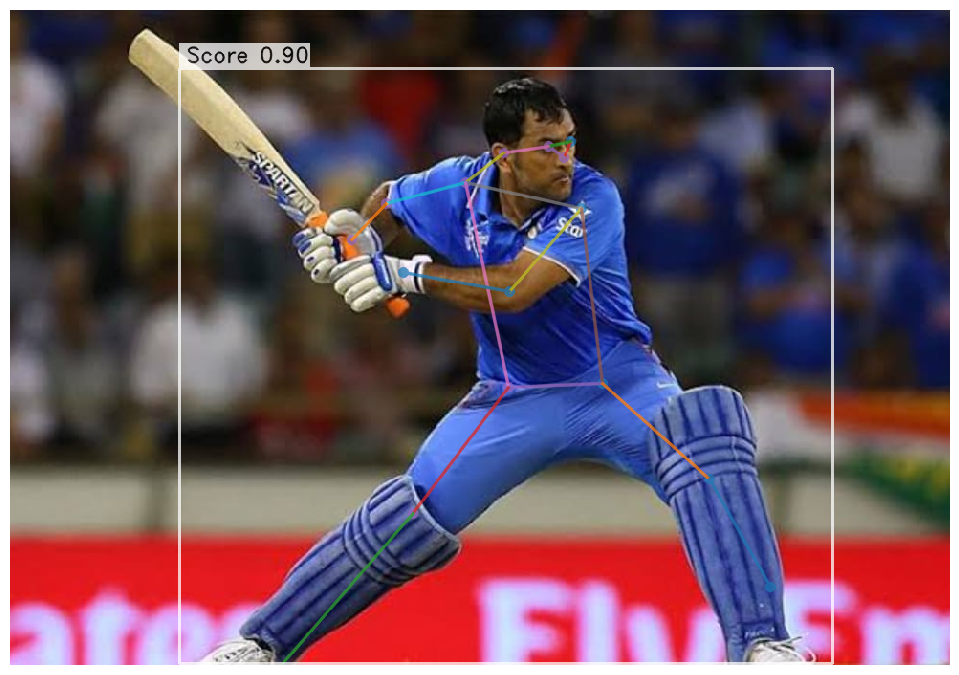

[2023-11-28 16:04:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


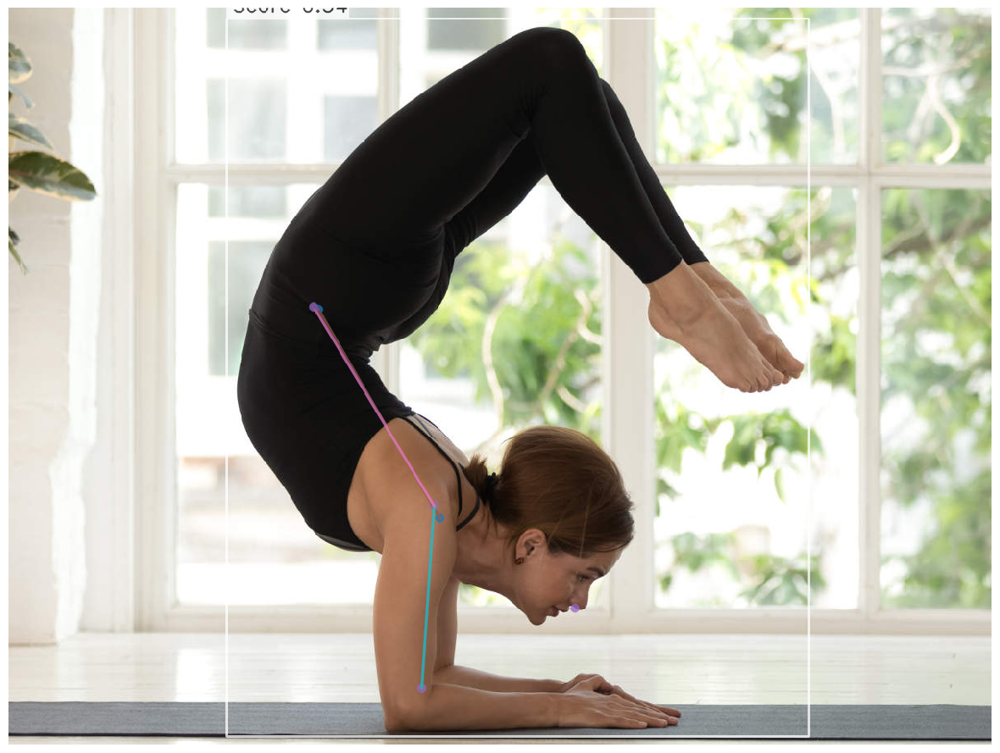

In [42]:
import requests
from PIL import Image
from io import BytesIO

# Assuming you have already loaded the model (yolo_nas_pose) as before

pose_urls = [
    'https://i.pinimg.com/originals/ac/61/dc/ac61dc446d0c6b97e74283cafc0945ef.jpg',
    'https://criccrunch.com/wp-content/uploads/2023/03/WhatsApp-Image-2023-03-01-at-12.11.59-PM.jpeg',
    'https://static.toiimg.com/photo/73174476.cms'


]

for pose_url in pose_urls:
    response = requests.get(pose_url)
    img = Image.open(BytesIO(response.content))
    yolo_nas_pose.predict(img, conf=0.5).show()
